<a href="https://colab.research.google.com/github/yuvalbraun/MedicalSegmentationDecathlon/blob/main/MedicalSegmentationDecathlon_final.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from datetime import datetime
from time import sleep
import os
import tarfile
import fnmatch
import nibabel as nib
from collections import Counter

import torch
import pandas as pd
import tensorflow as tf
from tensorflow.keras.models import *
from tensorflow.keras.layers import *
from tensorflow.keras.optimizers import *
from tensorflow.keras.callbacks import ModelCheckpoint, LearningRateScheduler
from tensorflow.keras import backend as keras

from math import log, ceil, floor
import numpy as np
import cv2
from PIL import Image

import matplotlib.animation as animation 
from matplotlib import pyplot as plt
from matplotlib import rc 
from sklearn.utils.class_weight import compute_class_weight
from sklearn.preprocessing import normalize as sklearn_normalize
from skimage.morphology import binary_opening
from scipy import ndimage, misc

from keras import backend as K 

In [ ]:
# Displays the processor information
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
!nvidia-smi
device

Mon Jul 26 15:02:27 2021       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 470.42.01    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla P100-PCIE...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   46C    P0    27W / 250W |      2MiB / 16280MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

device(type='cuda', index=0)

## Access data via Google Drive



In [ ]:
# Access data via Google Drive
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


#Data handling
###Data path
The address of the folder where the data is stored should be updated in the variable - datapath 

* Your Google Drive should have a folder with the data files as shown in the [challenge](https://drive.google.com/drive/folders/1HqEgzS8BV2c7xYNrZdEAnrHk7osJJ--2)


In [ ]:
datapath =  "/content/gdrive/MyDrive/MSD/"

###Extract data

There are two options for running the project:
1. The data is grouped in * .tar files and needs to be extracted
2. The data is extracted and uploadable

for option 1 choose Extract = True

for option 2 choose Extract = False


In [ ]:
Extract = False

tasks = [f for f in os.listdir(datapath) if f[-4:] == ".tar"] 
print("The list of *tar data in the folder:\n",tasks)

if Extract:
  for task in tasks: 
    tarfile.open(datapath + task, 'r').extractall()
    print(task, "unzip")

The list of *tar data in the folder:
 ['Task04_Hippocampus.tar', 'Task05_Prostate.tar', 'Task02_Heart.tar', 'Task09_Spleen.tar']


###Choose Task
Selecting the task for the project:

* for segmentation Heart Left Atrium choose Task = 0

* for segmentation Hippocampus head and body choose Task = 1



In [ ]:
Task = 0

Task_List = ["Task02_Heart","Task04_Hippocampus"]
task = Task_List[Task]
print("The", task.split("_")[1], "task has selected")
if Task:
  print("The Hippocampus challenge: Segmenting two neighbouring small structures with high precision")
else:
  print("The Heart challenge: Small training dataset with large variability")

The Heart task has selected
The Heart challenge: Small training dataset with large variability


## Preprocessing data


In [ ]:
# Determining the data path
xtrainpath = datapath + task + "/imagesTr/"
ytrainpath = datapath + task + "/labelsTr/"
xtestpath = datapath + task + "/imagesTs/"
ytestpath = datapath + task + "/labelsTs/"

def loaddata(testflag):
  # Load the data from the folder
  # For training data (testflag=0) load X and gt
  # For test data (testflag=0) load only X
  xpath = xtestpath if testflag else xtrainpath
  datafilesnames = [f for f in os.listdir(xpath) if (f[0] != '.' and f[-7:]==".nii.gz")]

  dataset = np.empty(len(datafilesnames), dtype=object)
  for i,f in enumerate(datafilesnames):
    dataset[i] = nib.load(xpath + f).get_data()  # Load the  data image

  if testflag:
    return dataset  # for test have only data image

  labels = np.empty(len(datafilesnames), dtype=object)
  for i,f in enumerate(datafilesnames):
    labels[i] = nib.load(ytrainpath + f).get_data()  # Load the label image

  return dataset, labels  # for train have data image and  label image


def showYimage(img,n):
  # Gets a picture and num of dimensions
  # Displays the image generically
  if n==2:
    plt.imshow(img[:,:,1],cmap='gray')
  else:
    plt.imshow(img[:,:,:])


def closest_power(x):
  # Gets a number and calculates the closest number that is power of 2
  possible_results = floor(log(x, 2)), ceil(log(x, 2))
  return 2**min(possible_results, key= lambda z: abs(x-2**z))


def findimagesize(dataset):
  # Calculate the most common image resolution
  x,y = [],[]

  for p in dataset :  # Collect image sizes
    x.append(p.shape[0])
    y.append(p.shape[1])
  
  xsizes = {v: k for k, v in Counter(x).items()}
  ysizes = {v: k for k, v in Counter(y).items()}

  return closest_power(xsizes[max(xsizes.keys())]), closest_power(ysizes[max(ysizes.keys())])
  
    
def normalize(data) :
  # Normalize the values in the images
  for i in range(data.shape[0]):
    data[i] = sklearn_normalize(data[i], norm='max', copy=True, return_norm=False)
  return data


def slicedata(data):
  # Gets volume and spreads it out into slices with a uniform resolution
  numofslices = sum([p.shape[2] for p in data])
  dataset = []
  sizes=[] 
  for p in data:
    sizes.append(p.shape)  # Save the original resolution for recovery
    for s in range(p.shape[2]):
      if p.T[s].shape == imagesize:  # check the resolution
        dataset.append(p.T[s])
      else:
        dataset.append(cv2.resize(p.T[s], imagesize))  # Change the resolution if necessary

  return normalize(np.array(dataset)),sizes


def slicelabel(data, num_of_labels):
  # Gets volume and spreads it out into slices with a uniform resolution
  numofslices = sum([p.shape[2] for p in data])
  i=0
  dataset = []
  sizes=[] 
  for p in data:
    sizes.append(p.shape)  # Save the original resolution for recovery
    for s in range(p.shape[2]):
      x = p.T[s]
      if x.shape != imagesize:  # Change the resolution if necessary
        x=cv2.resize(x, imagesize)
      x = tf.keras.utils.to_categorical(x,num_of_labels)  # Change the gt to several matrices as needed
      x=np.argmax(x,axis=-1)
      x = tf.keras.utils.to_categorical(x,num_of_labels)
      dataset.append(x)

  return np.array(dataset),sizes


def create_volumes(slices,sizes,to_original_size=False,num_of_labels=2):
  # Get slices and make volume
  volumes=[]
  k=0
  for size in sizes:
    if to_original_size:
      oldvolume=slices[k:k+size[2],:,:]
      newvolume=np.zeros((size[2],size[0],size[1]))
      for j in range(size[2]): # Create an original-sized volume
        newvolume[j,:,:]= cv2.resize(oldvolume[j,:,:],(size[1],size[0]))
      volumes.append(newvolume)
    else:
      volumes.append(slices[k:k+size[2],:,:])
    k=k+size[2]
  return volumes


def show_volume(volume): 
  # Show volume as animation
  rc('animation', html='jshtml')
  fig = plt.figure()
  img = []
  for i in range(volume.shape[0]):
    img.append([plt.imshow(cv2.flip(np.squeeze(volume[i,:,:]),0), cmap='gray')])
  ani = animation.ArtistAnimation(fig, img,interval=150, blit=False, repeat=True)
  return ani


def paint_area(image,area,color='r',gray=1):
  # Get an image and area and paints the selected area in the original image
  if color=='r':
    color_vec=[1,0,0]
  elif color=='g':
    color_vec=[0,1,0]
  else:
    color_vec=[0,0,1]
  if gray==1:
    rgb_image= np.zeros((image.shape[0],image.shape[1],3))
    rgb_image[:,:,0]=image
    rgb_image[:,:,1]=image
    rgb_image[:,:,2]=image
  else:
    rgb_image=image
  rgb_image[area==1,:]=color_vec
  return rgb_image


## Load data and divide to train, validation and test

In [ ]:
traindata, trainlabels = loaddata(0)  # Loading training data
print("Train data loaded")
testdata = loaddata(1)  # Loading test data
print("Test data loaded")
imagesize = findimagesize(traindata)
print("The uniform size for the images is:", imagesize)

# Divide the training data to training and validation
newtraindata = traindata[:ceil(0.8* traindata.shape[0])]  # 80% training data
newtrainlabels = trainlabels[:ceil(0.8* traindata.shape[0])]  # 80% training labels

valdata = traindata[ceil(0.8* traindata.shape[0]):]  # 20% validation data
vallabels = trainlabels[ceil(0.8* traindata.shape[0]):]  # 20% validation labels

# Calculation of the number of different classification classes
labels=np.unique(trainlabels[0]) 
num_of_labels=len(labels)

print("Number of training data:",newtraindata.shape[0])
print("Number of training labels:",newtrainlabels.shape[0])
print("Number of validation data:",vallabels.shape[0])
print("Number of validation labels:",valdata.shape[0])
print("Number of test data:",testdata.shape[0])
print("Number of classification classes:",num_of_labels)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:16: DeprecationWarning: get_data() is deprecated in favor of get_fdata(), which has a more predictable return type. To obtain get_data() behavior going forward, use numpy.asanyarray(img.dataobj).

* deprecated from version: 3.0
* Will raise <class 'nibabel.deprecator.ExpiredDeprecationError'> as of version: 5.0
  app.launch_new_instance()
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: DeprecationWarning: get_data() is deprecated in favor of get_fdata(), which has a more predictable return type. To obtain get_data() behavior going forward, use numpy.asanyarray(img.dataobj).

* deprecated from version: 3.0
* Will raise <class 'nibabel.deprecator.ExpiredDeprecationError'> as of version: 5.0


Train data loaded
Test data loaded
The uniform size for the images is: (256, 256)
Number of training data: 16
Number of training labels: 16
Number of validation data: 4
Number of validation labels: 4
Number of test data: 10
Number of classification classes: 2


### Slice the volumes to slices
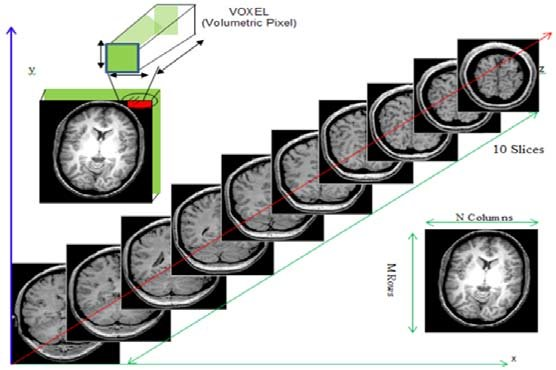


In [ ]:
# Slice all the volumes to slices in same size
(x_train, x_train_sizes),(y_train, y_train_sizes)= slicedata(newtraindata), slicelabel(newtrainlabels,num_of_labels)  # slice X
(x_val, x_val_sizes), (y_val, y_val_sizes) = slicedata(valdata), slicelabel(vallabels,num_of_labels)  # slice gt
(x_test, x_test_sizes) = slicedata(testdata)   # slice test data

print("The number of slices for the train data   is", x_train.shape[0],",The size is",  x_train.shape[1], "X",  x_train.shape[2])
print("The number of slices for the train labels is", y_train.shape[0],",The size is",  y_train.shape[1], "X",  y_train.shape[2])
print("The number of slices for the val data     is", x_val.shape[0],",The size is",  x_val.shape[1], "X",  x_val.shape[2])
print("The number of slices for the val labels   is", y_val.shape[0],",The size is",  y_val.shape[1], "X",  y_val.shape[2])
print("The number of slices for the test data    is", x_test.shape[0],",The size is",  x_test.shape[1], "X",  x_test.shape[2])

The number of slices for the train data   is 1801 ,The size is 256 X 256
The number of slices for the train labels is 1801 ,The size is 256 X 256
The number of slices for the val data     is 470 ,The size is 256 X 256
The number of slices for the val labels   is 470 ,The size is 256 X 256
The number of slices for the test data    is 1297 ,The size is 256 X 256


# Augmentation

##Augmentation functions
We have created 4 augmentation functions:

Horizontal flip, vertical flip, adding noise and rotation.

To test the effect of each augmentation on the accuracy percentages we allowed to choose between the different functions and combine them.

* According to [[1](https://www.ncbi.nlm.nih.gov/pmc/articles/PMC5977656/://)], unlike natural images (dogs, people, homes, etc.), in medical images, performing a vertical flip can improve outcomes.
To test the claim we made a comparison between the flips (attached in the project book), the conclusion was that the two types of flips contributed to the increase in accuracy in a similar way.

[1] Hussain, Z., Gimenez, F., Yi, D., & Rubin, D. (2018). Differential Data Augmentation Techniques for Medical Imaging Classification Tasks. AMIA ... Annual Symposium proceedings. AMIA Symposium, 2017, 979–984.

In [ ]:
def flip(data,labels,horizontal = 1):
  # Create a mirror image for the original image and gt
  # for horizontal flip - horizontal = 1
  # for vertical flip - horizontal = 0
  newdata = []
  newlabels = []

  for i in range(len(data)):  # Adding the original data
    newdata.append(data[i])
    newlabels.append(labels[i])

  for i in range(len(data)):  # Flip the images and add them to the data
    newdata.append(cv2.flip(data[i], horizontal))
    newlabels.append(cv2.flip(labels[i], horizontal))

  return np.array(newdata), np.array(newlabels)

def addnoise(data,labels):
  # Add noise only to the original image 
  mean = 0.0   
  std = 0.1    # standard deviation

  newdata = []
  newlabels = []

  for i in range(len(data)):  # Adding the original data
    newdata.append(data[i])
    newlabels.append(labels[i])

  for i in range(len(data)):  # Add noise to the images and add them to the data
    gaussian = np.random.normal(mean, std, (imagesize[1], imagesize[0]))
    newdata.append(np.clip(data[i] + gaussian, 0, 255))
    newlabels.append(labels[i])  # dont add noise to gt

  return np.array(newdata), np.array(newlabels)

def rotation(data,labels):
  # rotate the image for the original image and gt
  newdata = []
  newlabels = []

  for i in range(len(data)):  # Adding the original data
    newdata.append(data[i])
    newlabels.append(labels[i])

  for i in range(len(data)):  # rotate the original image and gt in 5 degrees
    rotate_label=ndimage.rotate(labels[i], 5, reshape=False)
    a=np.argmax(rotate_label,axis=-1)
    b=tf.keras.utils.to_categorical(a,num_of_labels)
    newdata.append(ndimage.rotate(data[i], 5, reshape=False))
    newlabels.append(b) 

  for i in range(len(data)):  # rotate the original image and gt in -5 degrees
    rotate_label=ndimage.rotate(labels[i], -5, reshape=False)
    a=np.argmax(rotate_label,axis=-1)
    b=tf.keras.utils.to_categorical(a,num_of_labels)
    newdata.append(ndimage.rotate(data[i], -5, reshape=False))
    newlabels.append(b) 

  return np.array(newdata), np.array(newlabels)


In [ ]:
#@title Flip demonstation
def flipdemonstation():
  x,y = flip(x_train[50:51],y_train[50:51])
  x,y = flip(x,y,0)
  
  plt.figure(figsize=(15, 15))

  ax = plt.subplot(4, 2, 1)
  plt.imshow(x[0], cmap="gray")
  plt.title("x original")
  plt.axis("off")

  ax = plt.subplot(4, 2, 2)
  showYimage(y[0],num_of_labels)
  plt.title("y original")
  #plt.axis("off")

  ax = plt.subplot(4, 2, 3)
  plt.imshow(x[1], cmap="gray")
  plt.title("x flip horizontal")
  plt.axis("off")

  ax = plt.subplot(4, 2, 4)
  showYimage(y[1],num_of_labels)
  plt.title("y flip horizontal")
  plt.axis("off")

  ax = plt.subplot(4, 2, 5)
  plt.imshow(x[2], cmap="gray")
  plt.title("x flip vertical")
  plt.axis("off")

  ax = plt.subplot(4, 2, 6)
  showYimage(y[2],num_of_labels)
  plt.title("y flip vertical")
  plt.axis("off")

  ax = plt.subplot(4, 2, 7)
  plt.imshow(x[3], cmap="gray")
  plt.title("x flip horizontal and vertical")
  plt.axis("off")

  ax = plt.subplot(4, 2, 8)
  showYimage(y[3],num_of_labels)
  plt.title("y flip horizontal and vertical")
  plt.axis("off")

In [ ]:
#@title Add noise demonstation
def addnoisedemonstation():
  x,y = addnoise(x_train[45:46],y_train[45:46])
  
  plt.figure(figsize=(10, 10))

  ax = plt.subplot(2, 2, 1)
  plt.imshow(x[0], cmap="gray")
  plt.title("x_train")
  plt.axis("off")

  ax = plt.subplot(2, 2, 2)
  showYimage(y[0],num_of_labels)
  plt.title("y_train")
  plt.axis("off")

  ax = plt.subplot(2, 2, 3)
  plt.imshow(x[1], cmap="gray")
  plt.title("x")
  plt.axis("off")

  ax = plt.subplot(2, 2, 4)
  showYimage(y[1],num_of_labels)
  plt.title("y")
  plt.axis("off")

In [ ]:
#@title Rotation demonstation
def rotationdemonstation():
  x,y = rotation(x_train[50:51],y_train[50:51])
  plt.figure(figsize=(10, 10))

  ax = plt.subplot(3, 2, 1)
  plt.imshow(x[1], cmap="gray")
  plt.title("x rotation right")
  plt.axis("off")

  ax = plt.subplot(3, 2, 2)
  showYimage(y[1],num_of_labels)
  plt.title("y rotation right")
  plt.axis("off")

  ax = plt.subplot(3, 2, 3)
  plt.imshow(x[0], cmap="gray")
  plt.title("x original")
  plt.axis("off")

  ax = plt.subplot(3, 2, 4)
  showYimage(y[0],num_of_labels)
  plt.title("y original")
  plt.axis("off")

  ax = plt.subplot(3, 2, 5)
  plt.imshow(x[2], cmap="gray")
  plt.title("x rotation left")
  plt.axis("off")

  ax = plt.subplot(3, 2, 6)
  showYimage(y[2],num_of_labels)
  plt.title("y rotation left")
  plt.axis("off")

###Demonstration of the use of augmentation function

To show the result of each augmentation choose show_demonstation = True 
else choose show_demonstation = False 


In [ ]:
show_demonstation = True

Flip demonstation:


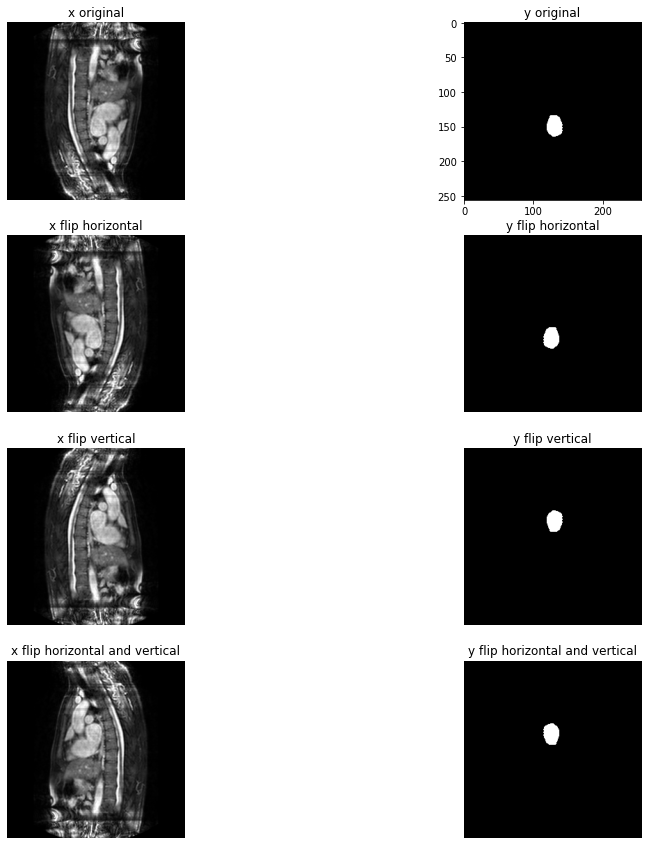

In [ ]:
if show_demonstation:
  print("Flip demonstation:")
  flipdemonstation()

Add noise demonstation:


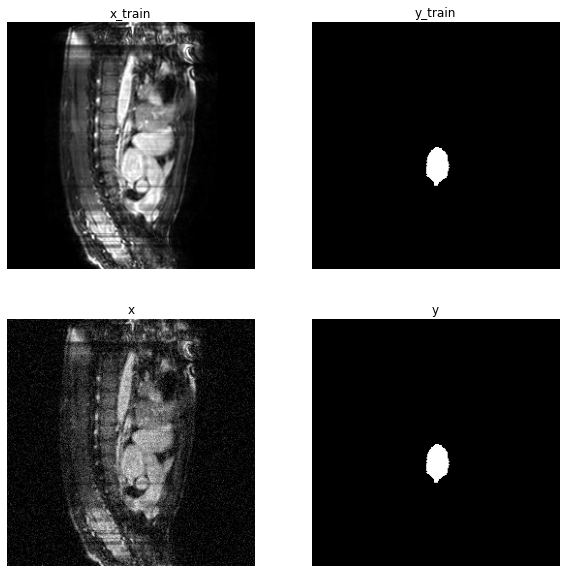

In [ ]:
if show_demonstation:
  print("Add noise demonstation:")
  addnoisedemonstation()


Rotation demonstation:


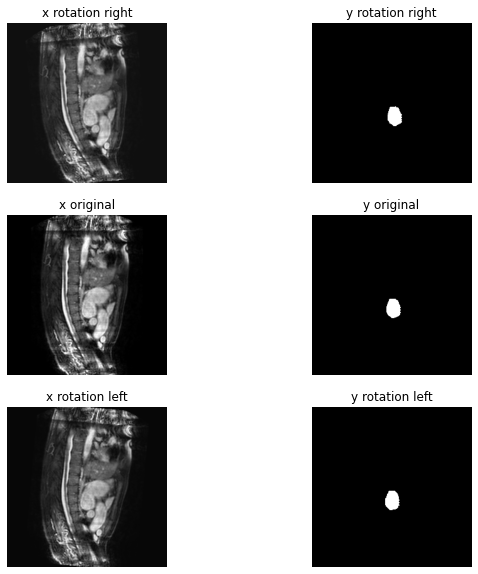

In [ ]:
if show_demonstation:
  print("Rotation demonstation:")
  rotationdemonstation()

### Choose which augmentation to use (which flip)

choose = 0 - Original data (default)

choose = 1 - Original data + Horizontal flip

choose = 2 - Original data + vertical flip

choose = 3 - Original data + Horizontal flip + vertical flip

In [ ]:
Augment = []

In [ ]:
choose = 0
if choose == 0:
  pass
elif choose == 1:
  x_train, y_train = flip(x_train,y_train) # flip horizontal
  Augment.append("flip horizontal")
elif choose == 2:
  x_train, y_train = flip(x_train,y_train, horizontal = 0)
  Augment.append("flip vertical")
elif choose == 3:
  x_flipV, y_flipV = flip(x_train,y_train, horizontal = 0)
  x_train, y_train = flip(x_flipV,y_flipV)
  Augment.append("flip horizontal and vertical")


print("data train len = ", len(x_train), len(y_train))


data train len =  1801 1801


### Choose which augmentation to use (noise and rotation)


choose = 0 - None (default)

choose = 1 - Original data + add Noise

choose = 2 - Original data + add Rotation

choose = 3 - Original data + add Noise + add Rotation

In [ ]:
choose = 0
if choose == 0:
  pass 
elif choose == 1:
  x_train, y_train = addnoise(x_train,y_train)
  Augment.append("add noise")
elif choose == 2:
  x_train, y_train = rotation(x_train,y_train)
  Augment.append("add rotation")
elif choose == 3:
  x_train, y_train = addnoise(x_train,y_train)
  x_train, y_train = rotation(x_train,y_train)
  Augment.append("add noise and rotation")


print("data train len = ", len(x_train), len(y_train))


data train len =  1801 1801


# The Model - Unet

In order to perform segmentation, we used the network U-Net and made a tuning parameters.

Implementation based on U-Net: Convolutional Networks for Biomedical
Image Segmentation https://arxiv.org/pdf/1505.04597.pdf

In [ ]:
def conv2d_block(input_tensor, n_filters, kernel_size=3, batchnorm=True):
    # first layer
    x = Conv2D(filters=n_filters, kernel_size=(kernel_size, kernel_size), kernel_initializer="he_normal",
               padding="same")(input_tensor)
    if batchnorm:
        x = BatchNormalization()(x)
    x = Activation("relu")(x)
    # second layer
    x = Conv2D(filters=n_filters, kernel_size=(kernel_size, kernel_size), kernel_initializer="he_normal",
               padding="same")(x)
    if batchnorm:
        x = BatchNormalization()(x)
    x = Activation("relu")(x)
    return x

def get_unet(input_img, n_filters=16, dropout=0.5, batchnorm=True):
    # contracting path
    c1 = conv2d_block(input_img, n_filters=n_filters*1, kernel_size=3, batchnorm=batchnorm)
    p1 = MaxPooling2D((2, 2)) (c1)
    p1 = Dropout(dropout*0.5)(p1)

    c2 = conv2d_block(p1, n_filters=n_filters*2, kernel_size=3, batchnorm=batchnorm)
    p2 = MaxPooling2D((2, 2)) (c2)
    p2 = Dropout(dropout)(p2)

    c3 = conv2d_block(p2, n_filters=n_filters*4, kernel_size=3, batchnorm=batchnorm)
    p3 = MaxPooling2D((2, 2)) (c3)
    p3 = Dropout(dropout)(p3)

    c4 = conv2d_block(p3, n_filters=n_filters*8, kernel_size=3, batchnorm=batchnorm)
    p4 = MaxPooling2D(pool_size=(2, 2)) (c4)
    p4 = Dropout(dropout)(p4)
    
    c5 = conv2d_block(p4, n_filters=n_filters*16, kernel_size=3, batchnorm=batchnorm)
    
    # expansive path
    u6 = Conv2DTranspose(n_filters*8, (3, 3), strides=(2, 2), padding='same') (c5)
    u6 = concatenate([u6, c4])
    u6 = Dropout(dropout)(u6)
    c6 = conv2d_block(u6, n_filters=n_filters*8, kernel_size=3, batchnorm=batchnorm)

    u7 = Conv2DTranspose(n_filters*4, (3, 3), strides=(2, 2), padding='same') (c6)
    u7 = concatenate([u7, c3])
    u7 = Dropout(dropout)(u7)
    c7 = conv2d_block(u7, n_filters=n_filters*4, kernel_size=3, batchnorm=batchnorm)

    u8 = Conv2DTranspose(n_filters*2, (3, 3), strides=(2, 2), padding='same') (c7)
    u8 = concatenate([u8, c2])
    u8 = Dropout(dropout)(u8)
    c8 = conv2d_block(u8, n_filters=n_filters*2, kernel_size=3, batchnorm=batchnorm)

    u9 = Conv2DTranspose(n_filters*1, (3, 3), strides=(2, 2), padding='same') (c8)
    u9 = concatenate([u9, c1], axis=3)
    u9 = Dropout(dropout)(u9)
    c9 = conv2d_block(u9, n_filters=n_filters*1, kernel_size=3, batchnorm=batchnorm)
    
    outputs = Conv2D(num_of_labels, (1, 1), activation='sigmoid') (c9)
    model = Model(inputs=[input_img], outputs=[outputs])
    return model

### Create Custom Metrics/Loss - Dice coeff loss
We use Dice Coeff as a metric for measure accuracy 

Dice loss originates from Sorensen–Dice coefficient, which is a statistic developed in 1940s to gauge the similarity between two samples. 

In [ ]:
smooth = 1. # Used to prevent the denominator from 0.
def dice_coef(y_true, y_pred):
  av=0
  for i in range(num_of_labels):  # calculate dice coef for all matrix
    y_true_f = K.flatten(y_true[:,:,:,i]) # Extend y_true to one dimension.
    y_pred_f = K.flatten(y_pred[:,:,:,i])
    intersection = K.sum(y_true_f * y_pred_f)
    av=av+(2. * intersection + smooth) / (K.sum(y_true_f * y_true_f) + K.sum(y_pred_f * y_pred_f) + smooth)
  return av/num_of_labels  # # calculate and return avg

def dice_coef_loss(y_true, y_pred): 
  # Loos function
  return 1. - dice_coef(y_true, y_pred)



## Data balance
Since there is an imbalance between the different areas of the classes we want to classify we decided to examine the effect of data balancing on the result (The results of the comparison are in the report)

we use the sklearn.utils.class_weight to compute class weight


* To balance the data choose Balance_data = True 
else choose Balance_data = False 

In [ ]:
Balance_data = False

if Balance_data:
  class_weights = compute_class_weight('balanced', [i for i in range(num_of_labels)], np.argmax(y_train,axis=-1).flatten())  #   [0, 1, 2]
else:
  class_weights = []

In [ ]:
def weightedLoss(originalLossFunc, weightsList): #new

    def lossFunc(true, pred):

        axis = -1 #if channels last 
        #axis=  1 #if channels first


        #argmax returns the index of the element with the greatest value
        #done in the class axis, it returns the class index    
        classSelectors = K.argmax(true, axis=axis) 
        classSelectors = tf.cast(classSelectors, tf.int32)

            #if your loss is sparse, use only true as classSelectors

        #considering weights are ordered by class, for each class
        #true(1) if the class index is equal to the weight index   
        classSelectors = [K.equal(i, classSelectors) for i in range(len(weightsList))]

        #casting boolean to float for calculations  
        #each tensor in the list contains 1 where ground true class is equal to its index 
        #if you sum all these, you will get a tensor full of ones. 
        classSelectors = [K.cast(x, K.floatx()) for x in classSelectors]

        #for each of the selections above, multiply their respective weight
        weights = [sel * w for sel,w in zip(classSelectors, weightsList)] 

        #sums all the selections
        #result is a tensor with the respective weight for each element in predictions
        weightMultiplier = weights[0]
        for i in range(1, len(weights)):
            weightMultiplier = weightMultiplier + weights[i]


        #make sure your originalLossFunc only collapses the class axis
        #you need the other axes intact to multiply the weights tensor
        loss = originalLossFunc(true,pred) 
        loss = loss * weightMultiplier

        return loss
    return lossFunc


#Experiments for adjusting hyper parameters
To perform the experiments effectively we wrote a training function. The function receives all the values of the network and the data, initializes the network, runs it and displays the run summary including the accuracy and graphs.

The full results is in the report.

In [ ]:
def train(num_of_filters, dropout_value, batch_norm, optimizer_type, show_summary, epoch,batch_size,class_weights=[]):
  model = get_unet(input_img, n_filters=num_of_filters, dropout=dropout_value, batchnorm=batch_norm)  # Network param initialization
  if len(class_weights)==0:  # use balanced data
    model.compile(optimizer=optimizer_type, loss=dice_coef_loss, metrics=[dice_coef])  # use original data
  else:
    model.compile(optimizer=Adam(), loss=weightedLoss(dice_coef_loss,class_weights), metrics=[dice_coef])   # use balanced data
  if show_summary:
    model.summary()

  logdir = datapath + "Model/logs/unet-batch_size-{}-epochs-{}-loss-{}.h5".format(batch_size, epoch, 'dice_coef_loss') + datetime.now().strftime("%Y%m%d-%H%M%S")
  tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=logdir)

  print("Run date and time:", datetime.now().strftime("%d.%m.%Y - %H:%M:%S"))
  
  # Train the net
  history = model.fit(x = x_train.reshape((x_train.shape[0], x_train.shape[1], x_train.shape[2] ,1)),
                      y = y_train.reshape((y_train.shape[0], y_train.shape[1], y_train.shape[2] ,num_of_labels)),
                      batch_size=batch_size, epochs = epoch,
                      validation_data=(x_val.reshape((x_val.shape[0], x_val.shape[1], x_val.shape[2] ,1)), 
                                      y_val.reshape((y_val.shape[0], y_val.shape[1], y_val.shape[2] ,num_of_labels))),  
                      callbacks=[
                                tensorboard_callback,
                                ModelCheckpoint(filepath=datapath + "Model/unet-pipeline-batch_size-{}-epochs-{}-loss-{}.h5".format(batch_size, epoch, 'dice_coef_loss'), verbose=1, save_best_only=True)                            
  ])
  # Print summary
  print("\n", history.history.keys())
  print("\nAugmentation:",Augment)
  print("\n\nNum of filters:", num_of_filters, "\tDropout value:", dropout_value, "\tBatch Normalization:", batch_norm)
  print("Batch size:", batch_size, "Optimizer type:", optimizer_type, "\n\n")
  #  "Accuracy"
  plt.plot(history.history['dice_coef'])
  plt.plot(history.history['val_dice_coef'])
  plt.title('model accuracy')
  plt.ylabel('accuracy')
  plt.xlabel('epoch')
  plt.legend(['train', 'validation'], loc='lower right')
  plt.show()
  # "Loss"
  plt.plot(history.history['loss'])
  plt.plot(history.history['val_loss'])
  plt.title('model loss')
  plt.ylabel('loss')
  plt.xlabel('epoch')
  plt.legend(['train', 'validation'], loc='lower right')
  plt.show()

  #  Evaluate with validation data
  print("Evaluate on validation data...")
  results = model.evaluate(x_val, y_val, batch_size=batch_size)
  print("Validation Accuracy:", results[1])

  return model, results[1]

The values we tunning was:
Optimizer type (Adam \ SGD), Num of filters, Dropout value, Batch size.

The full results is in the report.

In [ ]:
input_img = Input((imagesize[1], imagesize[0], 1), name='img')
acc = 0
filtersList = [12,16,20,24]
dropoutList = [0.05,0.2,0.5]
batchsizeList = [16,32,64]

optimizer_type = Adam()
num_of_filters = 24
dropout_value = 0.5
batch_norm = True
show_summary = False
epoch = 30
batch_size = 32


Run date and time: 26.07.2021 - 15:03:37
Epoch 1/30
57/57 [==============================] - 42s 378ms/step - loss: 0.5110 - dice_coef: 0.4898 - val_loss: 0.5706 - val_dice_coef: 0.4294

Epoch 00001: val_loss improved from inf to 0.57061, saving model to /content/gdrive/MyDrive/MSD/Model/unet-pipeline-batch_size-32-epochs-30-loss-dice_coef_loss.h5
Epoch 2/30
57/57 [==============================] - 19s 327ms/step - loss: 0.3309 - dice_coef: 0.6714 - val_loss: 0.4868 - val_dice_coef: 0.5125

Epoch 00002: val_loss improved from 0.57061 to 0.48682, saving model to /content/gdrive/MyDrive/MSD/Model/unet-pipeline-batch_size-32-epochs-30-loss-dice_coef_loss.h5
Epoch 3/30
57/57 [==============================] - 19s 327ms/step - loss: 0.1356 - dice_coef: 0.8649 - val_loss: 0.4252 - val_dice_coef: 0.5744

Epoch 00003: val_loss improved from 0.48682 to 0.42519, saving model to /content/gdrive/MyDrive/MSD/Model/unet-pipeline-batch_size-32-epochs-30-loss-dice_coef_loss.h5
Epoch 4/30
57/57 [======

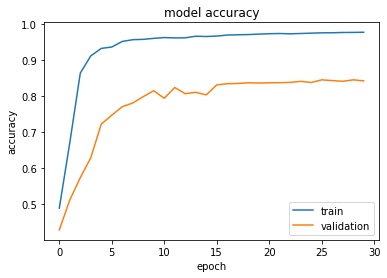

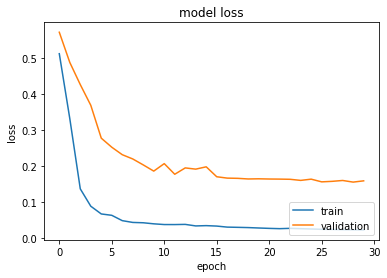

Evaluate on validation data...
15/15 [==============================] - 2s 85ms/step - loss: 0.1579 - dice_coef: 0.8434
Validation Accuracy: 0.8434476256370544


In [ ]:
train_best_model = True
if train_best_model:
  model, acc = train(num_of_filters, dropout_value, batch_norm, optimizer_type, show_summary, epoch,batch_size,class_weights)

##Adam optimizer
find the best number of filters and dropout value for Adam optimizer


In [ ]:
train_model = False
if train_model:
  optimizer_type = Adam()
  for i, num_of_filters in enumerate(filtersList):
    for j, dropout_value in enumerate(dropoutList):
      print("\n\nStart training",(i * len(filtersList) + j + 1), "out of",len(filtersList) * len(dropoutList))
      tempmodel, tempacc = train(num_of_filters, dropout_value, batch_norm, optimizer_type, show_summary, epoch,batch_size)
      if tempacc > acc:
        acc = tempacc
        model = tempmodel

After we find the best number of filters and dropout value for Adam optimizer we check for the best Batch size

In [ ]:
train_model = False
if train_model:
  optimizer_type = Adam()
  batchsizeList = [16,32,64]

  num_of_filters = 24
  dropout_value = 0.5
  batch_norm = True
  show_summary = False
  epoch = 30

  for i, batch_size_val in enumerate(batchsizeList):
    print("\n\nStart training", i+1, "out of",len(batchsizeList))
    tempmodel, tempacc = train(num_of_filters, dropout_value, batch_norm, optimizer_type, show_summary, epoch, batch_size_val)
    if tempacc > acc:
      acc = tempacc
      model = tempmodel

##SGD optimizer
find the best number of filters and dropout value for SGD optimizer


In [ ]:
train_model = False
if train_model:
  optimizer_type = SGD()
  for i, num_of_filters in enumerate(filtersList):
    for j, dropout_value in enumerate(dropoutList):
      print("\n\nStart training",(i * len(filtersList) + j + 1), "out of",len(filtersList) * len(dropoutList))
      tempmodel, tempacc = train(num_of_filters, dropout_value, batch_norm, optimizer_type, show_summary, epoch, batch_size) 
      if tempacc > acc:
        acc = tempacc
        model = tempmodel

From the results we learned that the use of SGD optimizer is significantly less good than the use of Adam optimizer and therefore we did not continue to perform further experiments on it.

#Comparison between the prediction of validation and gt
##predict

predict the labels for the validation data

In [ ]:
y_pred = model.predict(x_val.reshape((x_val.shape[0], x_val.shape[1], x_val.shape[2] ,1)))

y_pred_post_process=np.zeros((y_pred.shape[0],y_pred.shape[1],y_pred.shape[2],1)) 
for i in range(y_pred.shape[0]):
  y_pred_post_process[i,:,:,0] =  np.argmax (y_pred[i,:,:,:],axis=-1)

Recovering validation volume from slices

In [ ]:
x_val_volumes=create_volumes(x_val, x_val_sizes)
y_pred_post_process=y_pred_post_process.reshape(y_pred_post_process.shape[0], y_pred_post_process.shape[1], y_pred_post_process.shape[2]);
y_pred_post_process_volumes=create_volumes(y_pred_post_process, x_val_sizes)


In [ ]:
y_val_post_process=np.zeros((y_val.shape[0],y_val.shape[1],y_val.shape[2],1)) 
for i in range(y_val.shape[0]):
  y_val_post_process[i,:,:,0] =  np.argmax (y_val[i,:,:,:],axis=-1)
y_val_post_process_volumes=create_volumes(y_val_post_process, y_val_sizes)

Paint the desired area on the original image. Also used to display the animation.

In [ ]:
y_pred_paint= np.zeros((y_pred_post_process.shape[0],y_pred_post_process.shape[1],y_pred_post_process.shape[2],3))
y_val_paint= np.zeros((y_pred_post_process.shape[0],y_pred_post_process.shape[1],y_pred_post_process.shape[2],3))
for i in range(y_pred_post_process.shape[0]):
  y_val_paint[i,:,:,:] =paint_area(x_val[i,:,:],tf.keras.utils.to_categorical(y_val_post_process[i,:,:],num_of_labels)[:,:,1],color='r')  # gt validation image The first area you want to paint will be red.
  y_pred_paint[i,:,:,:] =paint_area(x_val[i,:,:],tf.keras.utils.to_categorical(y_pred_post_process[i,:,:],num_of_labels)[:,:,1],color='r')  # prdict image
  if num_of_labels !=2:
    y_pred_paint[i,:,:,:] =paint_area(y_pred_paint[i,:,:,:],tf.keras.utils.to_categorical(y_pred_post_process[i,:,:],num_of_labels)[:,:,2],color='g',gray=0)  # If there are two areas to paint, the second area will be painted green.
    y_val_paint[i,:,:,:] =paint_area(y_val_paint[i,:,:,:],tf.keras.utils.to_categorical(y_val_post_process[i,:,:],num_of_labels)[:,:,2],color='g',gray=0)

y_pred_paint_volumes=create_volumes(y_pred_paint, x_val_sizes)  # Recovering predict volume from slices
y_val_paint_volumes=create_volumes(y_val_paint, x_val_sizes)  # Recovering gt volume from slices

In [ ]:
def show_gt_and_pred(volume_idx,slice_idx,title=0):
  source=x_val_volumes[volume_idx][slice_idx]
  g_t=tf.keras.utils.to_categorical(y_val_post_process_volumes[volume_idx][slice_idx],num_of_labels)
  pred= tf.keras.utils.to_categorical(y_pred_post_process_volumes[volume_idx][slice_idx],num_of_labels)
  colors=['r','g','b']
  paint_gt=np.zeros((source.shape[0],source.shape[1],3))
  for i in range(1,num_of_labels):
    if i==1:
      paint_gt=paint_area(source,g_t[:,:,i],color=colors[i-1])
      paint_pred=paint_area(source,pred[:,:,i],color=colors[i-1])

    else:
      paint_gt=paint_area(paint_gt,g_t[:,:,i],color=colors[i-1],gray=0)
      paint_pred=paint_area(paint_pred,pred[:,:,i],color=colors[i-1],gray=0)
  plt.figure(figsize=(10, 10))
  ax = plt.subplot(1, 3, 1)
  plt.imshow(cv2.flip(np.squeeze(source),0), cmap="gray")
  if title==0:
    plt.title("Original Image")
  plt.axis("off")
  ax = plt.subplot(1, 3, 2)
  plt.imshow(cv2.flip(paint_gt, 0), cmap="gray")
  if title==0:
    plt.title("Ground Truth")
  plt.axis("off")
  ax = plt.subplot(1, 3, 3)
  plt.imshow(cv2.flip(paint_pred,0), cmap="gray")
  if title==0:
    plt.title("Prediction")
  plt.axis("off")


In [ ]:
def show_test_and_pred(volume_idx,slice_idx,title=0):
  source=x_val_volumes[volume_idx][slice_idx]
  pred= tf.keras.utils.to_categorical(y_pred_post_process_volumes[volume_idx][slice_idx],num_of_labels)
  colors=['r','g','b']
  for i in range(1,num_of_labels):
    if i==1:
      paint_pred=paint_area(source,pred[:,:,i],color=colors[i-1])
    else:
      paint_pred=paint_area(paint_pred,pred[:,:,i],color=colors[i-1],gray=0)
  plt.figure(figsize=(7, 7))
  ax = plt.subplot(1, 2, 1)
  plt.imshow(cv2.flip(np.squeeze(source),0), cmap="gray")
  if title==0:
    plt.title("Original Image")
  plt.axis("off")
  ax = plt.subplot(1, 2, 2)
  plt.imshow(cv2.flip(paint_pred,0), cmap="gray")
  if title==0:
    plt.title("Prediction")
  plt.axis("off")


##Prediction VS Ground Truth (validation data)

###Images

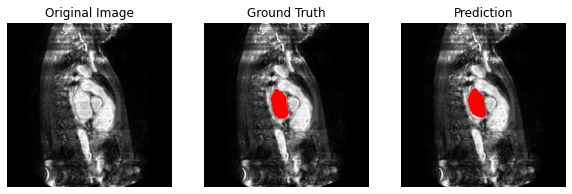

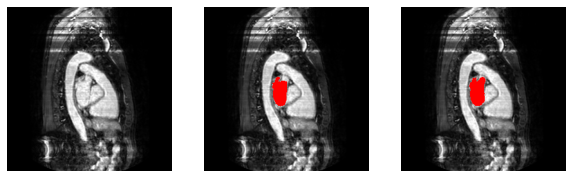

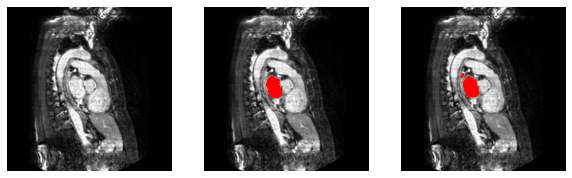

In [ ]:
for i in range(3):
  show_gt_and_pred(i,y_val_post_process_volumes[i].shape[0]//2,title=i)

###Animation

          prediction            ground truth


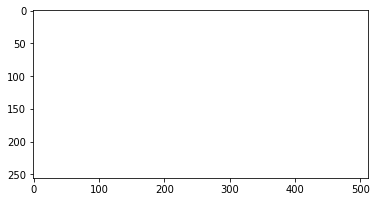

In [ ]:
print("          prediction            ground truth")
show_volume(np.concatenate((y_pred_paint_volumes[1],y_val_paint_volumes[1]),axis=2))

##Predict the labels for the Test dataset

Predict and recovering test volume from slices

In [ ]:
y_test = model.predict(x_test.reshape((x_test.shape[0], x_test.shape[1], x_test.shape[2] ,1)))
y_test_post_process=np.zeros((y_test.shape[0],y_test.shape[1],y_test.shape[2],1)) 
for i in range(y_test.shape[0]):
  y_test_post_process[i,:,:,0] =  np.argmax (y_test[i,:,:,:],axis=-1)
  
y_test_post_process_volumes=create_volumes(y_test_post_process, x_test_sizes,to_original_size=True)

###Images

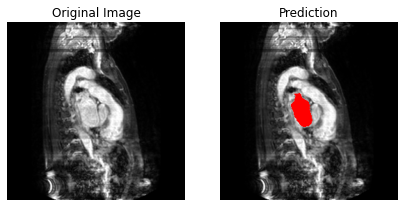

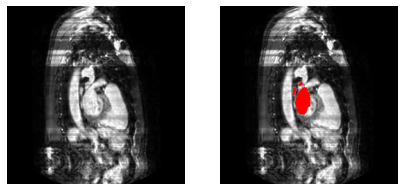

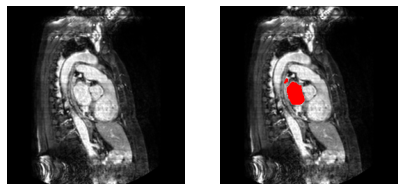

In [ ]:
for i in range(3):
  show_test_and_pred(i,y_test_post_process_volumes[i].shape[0]//2,title=i)